# Zero-Shot Learning Experiments: Latent Embeddings

Using https://joeddav.github.io/blog/2020/05/29/ZSL.html#A-latent-embedding-approach

## Experiments for the Latent Embedding Zero Shot Approach


- Labels
    - [x] Mix credit and guarantee together 
    - [x] Take out general incentive and unknown 
    - [ ] Replace unknown with something else?
- [x] Visualize embeddings 
- Embeddings
    - [x] Include the labels in the Z matrix process
    - [ ] Different values of lamda for projection matrix (for regulatization)
    - [ ] Learn an additional least-squares projection matrix to the embeddings of any available labels from their corresponding data embeddings (as described in the *When some annotated data is available* section of the base article)
    - Top k words 
        - [ ] Different values of k for top k words
        - [ ] Use more words for k words, and use the stems of the word 
- [ ] Model type for sentence embeddings
- [ ] Model type for word embeddings?
- [x] Fine tuning sentence model

### Initial setup

#### Preliminary: Load labeled sentences from WRI Policy Tags

This is temporary - we should convert WRI_Policy_Tags to JSON

In [18]:
import sys
sys.path.append("../../../")
sys.path.append("../../../../")

from tasks.data_loader.src.utils import *
from tasks.data_augmentation.src.zero_shot_classification.latent_embeddings_classifier import *
from tasks.evaluate_model.src.model_evaluator import *
from tasks.data_visualization.src.plotting import *

from sentence_transformers import SentenceTransformer
import pandas as pd
import spacy

In [19]:
# Load data
data_excel = pd.read_excel("../../input/WRI_Policy_Tags.xlsx", engine="openpyxl", sheet_name=None)
labeled_sents = labeled_sentences_from_excel(data_excel)
all_sents = sentences_from_model_output(labeled_sents)
all_labels = labels_from_model_output(labeled_sents)
label_names = unique_labels(all_labels)

In [3]:
# It may be necessary to download the es_core_news_lg pre-trained model
# ! python -m spacy download es_core_news_lg

In [20]:
# Load models
es_nlp = spacy.load('es_core_news_lg')
# sbert_model = SentenceTransformer('xlm-r-100langs-bert-base-nli-stsb-mean-tokens')

### Experiment 1. Merge Credit and Guarantee

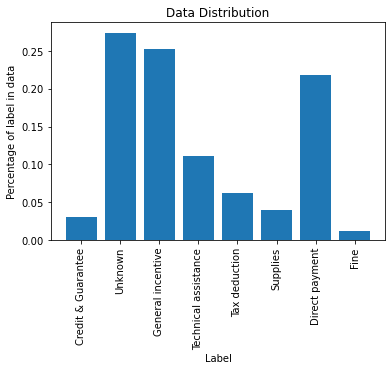

Label counts:
{'Credit & Guarantee': 0.030441400304414, 'Unknown': 0.273972602739726, 'General incentive': 0.2526636225266362, 'Technical assistance': 0.1111111111111111, 'Tax deduction': 0.0624048706240487, 'Supplies': 0.0395738203957382, 'Direct payment': 0.2176560121765601, 'Fine': 0.0121765601217656}


In [5]:
# Update labels
exp1_labels = merge_labels(all_labels, ["Credit", "Guarantee"]) 
label_names = unique_labels(exp1_labels)
numeric_labels = labels2numeric(exp1_labels, label_names)
plot_data_distribution(numeric_labels, label_names)

In [6]:
proj_matrix = calc_proj_matrix(all_sents, 50, es_nlp, sbert_model, 0.1)
model_preds, model_scores = classify_all_sentences(all_sents, label_names, sbert_model, proj_matrix)

100%|██████████| 657/657 [02:23<00:00,  4.59it/s]


In [7]:
numeric_preds = labels2numeric(model_preds, label_names)

In [8]:
evaluator = ModelEvaluator(label_names, y_true=numeric_labels, y_pred=numeric_preds)

/home/davids/miniconda3/envs/wri/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [9]:
evaluator.avg_f1

array([0.14287463, 0.18283926])

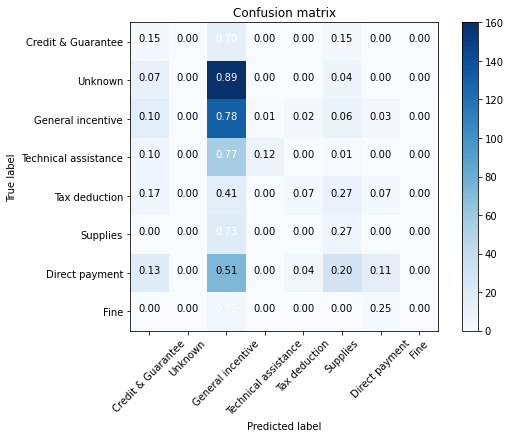

In [10]:
evaluator.plot_confusion_matrix(color_map='Blues')

### Experiment 2. Get rid of Unknown and General incentive, and merge Credit and Guarantee

In [21]:
# Update data
filtered_sents_maps = filter_out_labeled_sents(labeled_sents, ["General incentive", "Unknown"])
exp2_sents = [sent['text'] for sent in filtered_sents_maps]
exp2_labels = [sent['labels'][0] for sent in filtered_sents_maps]
exp2_labels = merge_labels(exp2_labels, ["Credit", "Guarantee"]) 
exp2_label_names = unique_labels(exp2_labels)

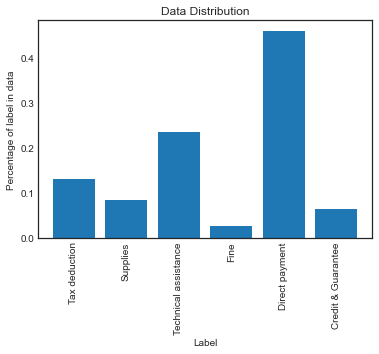

Label counts:
{'Tax deduction': 0.13183279742765272, 'Supplies': 0.08360128617363344, 'Technical assistance': 0.2347266881028939, 'Fine': 0.02572347266881029, 'Direct payment': 0.45980707395498394, 'Credit & Guarantee': 0.06430868167202572}


In [22]:
numeric_labels = labels2numeric(exp2_labels, exp2_label_names)
plot_data_distribution(numeric_labels, exp2_label_names)

In [23]:
proj_matrix = calc_proj_matrix(all_sents, 50, es_nlp, sbert_model, 0.1)
model_preds, model_scores = classify_all_sentences(exp2_sents, exp2_label_names, sbert_model, proj_matrix)
numeric_preds = labels2numeric(model_preds, exp2_label_names)

KeyboardInterrupt: 

In [28]:
evaluator = ModelEvaluator(exp2_label_names, y_true=numeric_labels, y_pred=numeric_preds)

/home/davids/miniconda3/envs/wri/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [29]:
evaluator.avg_f1

array([0.25850617, 0.36937602])

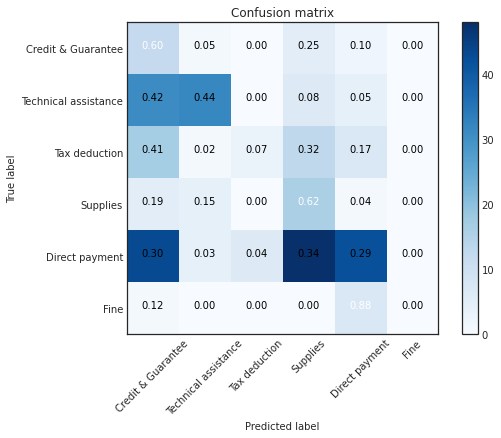

In [30]:
evaluator.plot_confusion_matrix(color_map='Blues')

### Experiment 3. Visualizing data (Setup from experiment 2.)

In [47]:
sbert_model = SentenceTransformer('xlm-r-100langs-bert-base-nli-stsb-mean-tokens')
proj_matrix = calc_proj_matrix(exp2_sents, 50, es_nlp, sbert_model, 0.1)
all_sent_embs = encode_all_sents(exp2_sents, sbert_model, proj_matrix)

100%|██████████| 311/311 [01:01<00:00,  5.02it/s]


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 311 samples in 0.028s...
[t-SNE] Computed neighbors for 311 samples in 0.169s...
[t-SNE] Computed conditional probabilities for sample 311 / 311
[t-SNE] Mean sigma: 11.726983
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.996441
[t-SNE] KL divergence after 1000 iterations: 0.790838
[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 311 samples in 0.001s...
[t-SNE] Computed neighbors for 311 samples in 0.019s...
[t-SNE] Computed conditional probabilities for sample 311 / 311
[t-SNE] Mean sigma: 11.726983
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.996441
[t-SNE] KL divergence after 1000 iterations: 0.790838


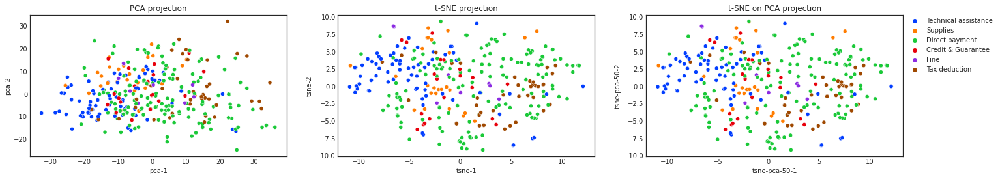

In [49]:
visualize_embeddings_2D(all_sent_embs, exp2_labels, pca_k_n_comps=50, tsne_perplexity=50)

In [50]:
visualize_PCA_embeddings_3D(all_sent_embs, exp2_labels)

### Experiment 4. Include the labels in the Z matrix process (Setup from experiment 2.)

In [51]:
# When we want to include the labels in the projection matrix, we just add them as an extra parameter
proj_matrix = calc_proj_matrix(all_sents, 50, es_nlp, sbert_model, 0.1, include_labels=exp2_label_names)
model_preds, model_scores = classify_all_sentences(exp2_sents, exp2_label_names, sbert_model, proj_matrix)
numeric_preds = labels2numeric(model_preds, label_names)

100%|██████████| 311/311 [00:55<00:00,  5.60it/s]


In [52]:
evaluator = ModelEvaluator(label_names, y_true=numeric_labels, y_pred=numeric_preds)

/home/davids/miniconda3/envs/wri/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/davids/miniconda3/envs/wri/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [53]:
evaluator.avg_f1

array([0.09469175, 0.20031866])

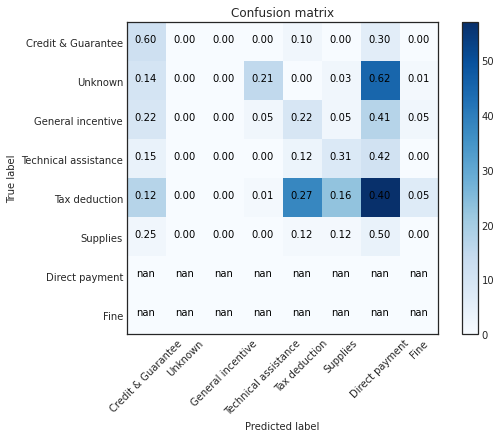

In [54]:
evaluator.plot_confusion_matrix(color_map='Blues')

### Experiment 5.  Fine tune sentence embedding model (Setup from experiment 2.)
The FineTuning folder that contains the fine-tuned model is located on Google Drive under the folder WRI-LatinAmerica-Talent/Modeling/FineTuning. To execute the following code you should download this folder to tasks/augment_data/output/FineTuning.

In [24]:
# Load the saved model and obtain random sentence embedding
model_save_path = "../../output/FineTuning_model=xlm-r-100langs-bert-base-nli-stsb_test-perc=15"
load_model = SentenceTransformer(model_save_path)

In [25]:
# Simple low-dim projection
all_sent_embs = encode_all_sents(exp2_sents, load_model)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 311 samples in 0.002s...
[t-SNE] Computed neighbors for 311 samples in 0.066s...
[t-SNE] Computed conditional probabilities for sample 311 / 311
[t-SNE] Mean sigma: 12.449210
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.903290
[t-SNE] KL divergence after 1000 iterations: 0.637608


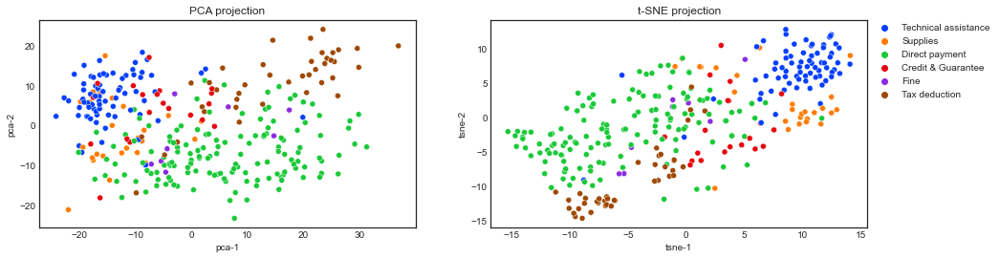

In [36]:
visualize_embeddings_2D(all_sent_embs, exp2_labels, tsne_perplexity=40)

100%|██████████| 311/311 [00:48<00:00,  6.39it/s]


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 311 samples in 0.002s...
[t-SNE] Computed neighbors for 311 samples in 0.051s...
[t-SNE] Computed conditional probabilities for sample 311 / 311
[t-SNE] Mean sigma: 12.449210
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.903290
[t-SNE] KL divergence after 1000 iterations: 0.637609


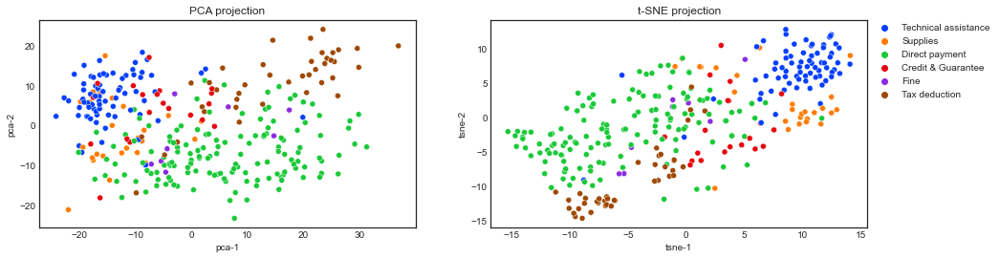

In [27]:
# Projection matrix Z low-dim projection
proj_matrix = calc_proj_matrix(exp2_sents, 50, es_nlp, load_model, 0.01)
all_sent_embs = encode_all_sents(exp2_sents, load_model, proj_matrix)
visualize_embeddings_2D(all_sent_embs, exp2_labels, tsne_perplexity=40)

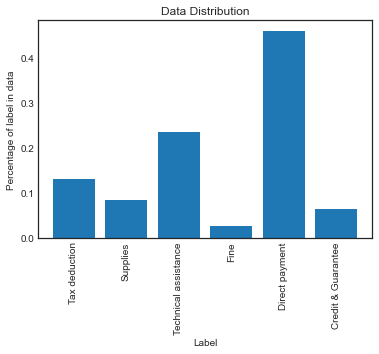

Label counts:
{'Tax deduction': 0.13183279742765272, 'Supplies': 0.08360128617363344, 'Technical assistance': 0.2347266881028939, 'Fine': 0.02572347266881029, 'Direct payment': 0.45980707395498394, 'Credit & Guarantee': 0.06430868167202572}


In [28]:
numeric_labels = labels2numeric(exp2_labels, exp2_label_names)
plot_data_distribution(numeric_labels, exp2_label_names)

In [29]:
# Classify all sentences
model_preds, model_scores = classify_all_sentences(exp2_sents, exp2_label_names, load_model, proj_matrix)
numeric_preds = labels2numeric(model_preds, exp2_label_names)

100%|██████████| 311/311 [00:49<00:00,  6.24it/s]


In [30]:
evaluator = ModelEvaluator(exp2_label_names, y_true=numeric_labels, y_pred=numeric_preds)

/Users/dafirebanks/miniconda3/envs/wri_env/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [31]:
evaluator.avg_f1

array([0.40507744, 0.50481657])

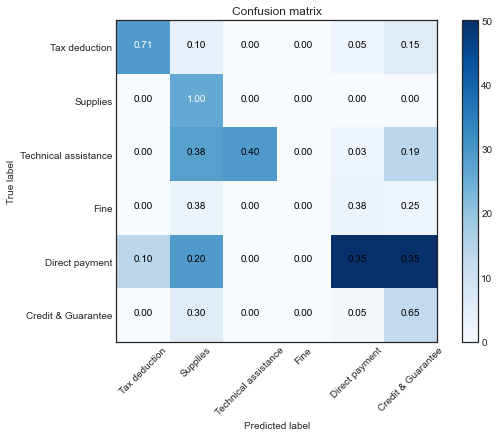

In [32]:
evaluator.plot_confusion_matrix(color_map='Blues')